<a href="https://colab.research.google.com/github/Gabxist/Pdi/blob/main/Trabalho_de_Anaglifo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import cv2 as cv
from pandas import read_csv
from google.colab.patches import cv2_imshow

In [ ]:
# Importar repósitorio de GitHub
!rm -r Pdi
!git clone https://github.com/Gabxist/Pdi.git
caminho = '/content/Pdi/'

rm: cannot remove 'Pdi': No such file or directory
Cloning into 'Pdi'...
remote: Enumerating objects: 14, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 14 (delta 4), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (14/14), 35.11 MiB | 7.02 MiB/s, done.
Resolving deltas: 100% (4/4), done.


In [ ]:
#Importando as imagens R e L para o processamento
L = cv.imread(caminho +'L.jpg')
R = cv.imread(caminho +'R.jpg')

# transformando em monocromáticas
L = cv.cvtColor(L, cv.COLOR_RGB2GRAY)
R = cv.cvtColor(R, cv.COLOR_RGB2GRAY)

nl, nc = L.shape
print(nc,nl)

3584 2016


In [ ]:
#importando as coordenadas dos pontos de apoio escolhidos:
pontos = read_csv(caminho +'Pontos.csv', header = 0, sep = ';')
print( pontos)

     xl    yl    xr    yr
0  2232   637  2307   628
1  1429   643  1500   633
2   464  1265   538  1254
3  3155   852  3231   841
4   227   910   305   898
5  3184  1441  3215  1435


In [ ]:
#Criando a matriz das coordenadas dos pontos da imagem base
m= []
for i in range(len(pontos)):
  for j in range(2):
    m.append(int(pontos.iloc[i,j]))
print(m)

[2232, 637, 1429, 643, 464, 1265, 3155, 852, 227, 910, 3184, 1441]


In [ ]:
#formatando corretamente os dados do arquivo "Pontos" para a matriz E
E = []
for _, row in pontos.iterrows():
    E.append([int(row['xl']), int(row['yl']), 1, 0, 0, 0])
    E.append([0, 0, 0, int(row['xr']), int(row['yr']), 1])

print(E)

[[2232, 637, 1, 0, 0, 0], [0, 0, 0, 2307, 628, 1], [1429, 643, 1, 0, 0, 0], [0, 0, 0, 1500, 633, 1], [464, 1265, 1, 0, 0, 0], [0, 0, 0, 538, 1254, 1], [3155, 852, 1, 0, 0, 0], [0, 0, 0, 3231, 841, 1], [227, 910, 1, 0, 0, 0], [0, 0, 0, 305, 898, 1], [3184, 1441, 1, 0, 0, 0], [0, 0, 0, 3215, 1435, 1]]


In [ ]:
#Obtenção da matriz A = parâmetros de Rotação e Translação
S = np.matrix(m)
S = np.transpose(S)
E = np.matrix(E)
Et = np.linalg.matrix_transpose(E) # matriz transposta
A = np.matmul(np.matmul(np.linalg.inv(np.linalg.matmul(Et,E)),Et),S)

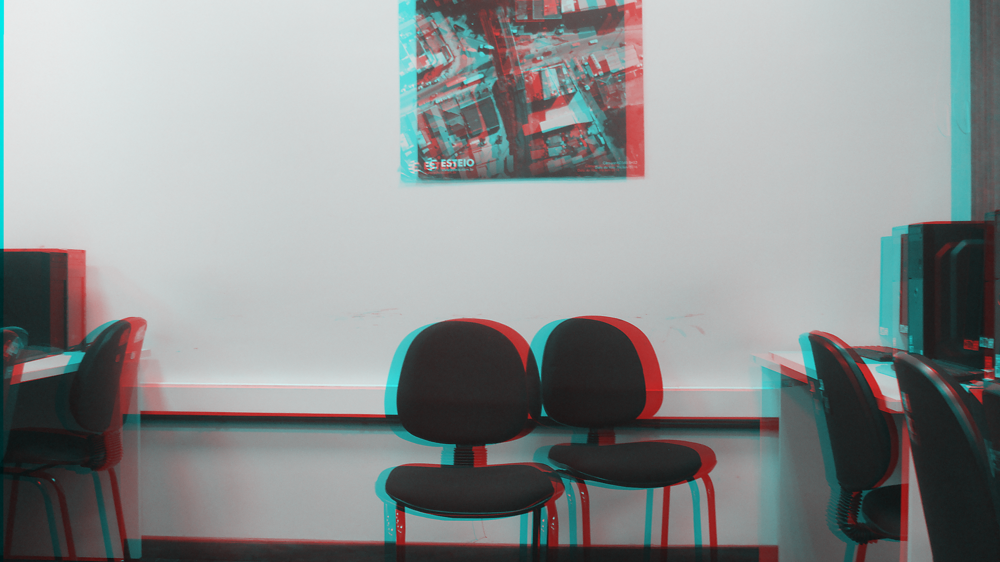

In [ ]:
# noma imagem do tamanho das originais:
X = np.zeros([nl,nc,3],dtype = np.uint8)

#função para criar o anaglifo com base nos calculos anteriores:
for lin in range(nl):
  for col in range(nc):
    X[lin,col,0] = R[lin,col]
    X[lin,col,1] = R[lin,col]
    B = np.array([[lin, col, 1, 0, 0, 0], [0, 0, 0, lin, col, 1]])
    C = B @ A
    x_S, y_S = int(C[0, 0]), int(C[1, 0])
    if 0 <= x_S < nl and 0 <= y_S < nc:
      X[x_S, y_S, 2] = L[lin, col]

# mostrando o anaglifo:
cv2_imshow(X)